In [127]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import seaborn as sns
from collections import Counter
from wordcloud import WordCloud, STOPWORDS
# import textblob
# from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import string
import re
import spacy
import gensim
import warnings
warnings.filterwarnings("ignore")

### **Plan of Action**

1. Load data
2. EDA
3. Feature engineering
4. Topic modelling
    - Top2Vec
5. Repeat step 4

In [128]:
df = pd.read_csv('../topic_data.csv')

In [129]:
df_copy = df.copy()
df_copy.describe()

,raw_text_length,year,month,cleaned_text_length
count,4568.000000,4568.0,4568.000000,4568.000000
mean,27.330560,2023.0,3.703590,24.769483
std,11.840659,0.0,0.456724,11.581002
min,1.000000,2023.0,3.000000,1.000000
25%,17.000000,2023.0,3.000000,15.000000
50%,27.000000,2023.0,4.000000,24.000000
75%,37.000000,2023.0,4.000000,34.000000
max,61.000000,2023.0,4.000000,57.000000


In [130]:
df_copy.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4568 entries, 0 to 4567
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   text                 4568 non-null   object
 1   date                 4568 non-null   object
 2   raw_text_length      4568 non-null   int64 
 3   year                 4568 non-null   int64 
 4   month                4568 non-null   int64 
 5   cleaned_text         4568 non-null   object
 6   cleaned_text_length  4568 non-null   int64 
dtypes: int64(4), object(3)
memory usage: 3.2 MB


**Memory management**

In [131]:
# Memory management
def memory_magment(df):
    for col in df.columns:
        col_type = df[col].dtype

        if col_type != np.object:
            c_min = df[col].min()
            c_max = df[col].max()

            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8) # int 8
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16) # int 16
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)  # in 32
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64) # int 64 
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else: 
                    df[col] = df[col].astype(np.float64)
    return df
df_memory = df_copy.copy()
df_memory = memory_magment(df_memory)    

In [132]:
df_memory.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4568 entries, 0 to 4567
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   text                 4568 non-null   object
 1   date                 4568 non-null   object
 2   raw_text_length      4568 non-null   int8  
 3   year                 4568 non-null   int16 
 4   month                4568 non-null   int8  
 5   cleaned_text         4568 non-null   object
 6   cleaned_text_length  4568 non-null   int8  
dtypes: int16(1), int8(3), object(3)
memory usage: 3.1 MB


In [133]:
featured_data = df_memory[['text']]

In [134]:
featured_data

,text
0,"""Ah, yes. I just love waking up to the sweet a..."
1,When @ViolavonCramon\nflies to Georgia 🇬🇪 to t...
2,Exclusive — Rep. Jeff Van Drew: Democrats Afra...
3,"It’s April 03, 2023 at 12:29PM\nStop Your Peri..."
4,#PMAtCBIDiamondJubilee\nCorruption and dynasti...
...,...
4563,If the Word cannot provoke you to preach the g...
4564,"cept\nmy own and that of the manager.\n\n""'My ..."
4565,Graham Potter's Chelsea exit set for huge impa...
4566,How to watch Manchester United vs Brentford - ...


In [135]:
docs = featured_data['text'].tolist()

In [136]:
docs[0]

'"Ah, yes. I just love waking up to the sweet aroma of political chaos and corruption in the morning. It\'s like a breath of fresh air...if that air was filled with hot garbage." #politics #sarcasm'

### **Top2Vec**

In [137]:
from top2vec import Top2Vec

Top2Vec takes care of the preprocessing for us.

In [138]:
model = Top2Vec(docs, embedding_model="doc2vec",workers=2,ngram_vocab=True,speed="deep-learn")  
# Using bigrams
# doc2vec & fast-learn" is used by default

2023-05-20 15:36:13,590 - top2vec - INFO - Pre-processing documents for training
2023-05-20 15:36:14,347 - top2vec - INFO - Creating joint document/word embedding
2023-05-20 15:38:32,058 - top2vec - INFO - Creating lower dimension embedding of documents
2023-05-20 15:38:43,471 - top2vec - INFO - Finding dense areas of documents
2023-05-20 15:38:43,850 - top2vec - INFO - Finding topics


**Get Number of Topics**

In [139]:
model.get_num_topics()

46

In [140]:
model.get_num_topics()

46

In [141]:
len(model.vocab)

1024

**Querying the document**

In [142]:
query = "Ai can be used to save lives?"
query2 = "elections in NIgeria?"
ef =None
num_doc=2
return_docs = True
index = True
documents,doc_scores, doc_ids = model.query_documents(query=query2,
                                                ef=ef,num_docs=num_doc,
                                                return_documents=return_docs,
                                                use_index=False,)

In [143]:
for doc,score,ids in zip(documents,doc_scores,doc_ids):
    print(f"Document {ids}:{doc}\n Score:{score}\n")

Document 517:Happy Saturday!
#Nigeria #Nigeriadecide2023 #NigeriaDecides2023 #NigeriaVoteWatch2023 #NigeriaNews #nigerianfood #Nigerians #NairaScarcity #nairaredesign #naijablog #Naija #Naijaleaks #naijafarmertips #NaijaBet #nowornever #Obidients https://t.co/TWaOa8Fd7x
 Score:0.8986635208129883

Document 508:Peter Obi won the February 25, 2023 Nigeria Presidential elections!
Peter Obi won the February 25, 2023 Nigeria Presidential elections!
Peter Obi won the February 25, 2023 Nigeria Presidential elections!
#PeterObiIsMyPresident
#NigeriaDecides2023
 Score:0.8955618143081665



**Querying the topics**

In [144]:
query = "Ai can be used to save lives?"
query2 = "elections in NIgeria?"
num_doc=2
topics_words,word_scores, topic_scores, topic_nums = model.query_topics(query=query2,
                                                num_topics=num_doc)

In [146]:
for topics_words, topic_scores, topic_nums in zip(topics_words,topic_scores, topic_nums):
    print(f"Topic {topic_nums}:\nWords: {topics_words}\nTopic score:{topic_scores}\n")

Topic 29:
Words: ['nigeriadecides obiwon' 'elections nigeriadecides' 'how many'
 'atlanta georgia' 'case against' 'guo now' 'apply now' 'inbox now'
 'now available' 'medical school' 'right now' 'ai medical' 'graham potter'
 'teaching job' 'nigeria' 'atlanta was' 'going to'
 'against emoryuniversity' 'what happened' 'what fire' 'messi name'
 'climate change' 'lionel messi' 'what happens' 'messi endorsed'
 'bbnaija messi' 'nothing but' 'graham' 'or serious' 'society and'
 'disaster troll' 'alumni judges' 'natural disaster' 'disaster response'
 'disaster movie' 'disaster management' 'don want' 'disaster recovery'
 'disaster risk' 'complete disaster' 'environmental disaster' 'want to'
 'the once' 'of society' 'world cup' 'election' 'judges' 'nigeriadecides'
 'don miss' 'mining riches']
Topic score:0.8864219784736633

Topic 14:
Words: ['teaching job' 'of society' 'society and' 'right now' 'riches takes'
 'or serious' 'quality manager' 'project manager' 'sales manager'
 'product manager' 'mi

This will return the number of topics that Top2Vec has found in the data.

**Get Topic Sizes**

In [147]:
topic_sizes, topic_nums = model.get_topic_sizes()

This will return the number of documents most similar to each topic. Topics are in decreasing order of size.

In [148]:
topic_sizes # The number of documents most similar to each topic.

array([504, 258, 239, 201, 180, 176, 138, 126, 117, 110, 109, 101,  93,
        92,  92,  92,  89,  86,  82,  79,  78,  77,  77,  75,  74,  73,
        72,  71,  70,  70,  68,  66,  64,  62,  61,  60,  59,  57,  52,
        50,  50,  49,  48,  41,  40,  40], dtype=int64)

In [149]:
topic_nums # 46 topics
# The unique index of every topic will be returned

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45], dtype=int64)

40 documents are related to topic index 45.

**Get Topics**

This will return the topics in decreasing size.

In [150]:
topic_words, word_scores, topic_nums = model.get_topics(10) # n_topics

**topic_words:** For each topic the top 50 words are returned, in order of semantic similarity to topic.

**word_scores:** For each topic the cosine similarity scores of the top 50 words to the topic are returned.

**topic_nums:** The unique index of every topic will be returned.


They are all arrays/list values

In [151]:
# topic_nums
# [ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
# 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
# 34, 35, 36, 37]

for words, scores, topic in zip(topic_words, word_scores, topic_nums):
    print(f"Topic: {topic}\nWords: {words} ")

Topic: 0
Words: ['healthtech' 'industry' 'technology' 'ai' 'healthcare'
 'transforming healthcare' 'patient' 'innovation' 'health' 'tech'
 'medtech' 'machinelearning' 'transforming' 'healthcare healthtech'
 'healthcare plans' 'digitalhealth' 'education'
 'revolutionizing healthcare' 'chatgpt' 'medicine'
 'transforming industries' 'healthcare providers' 'healthcare lifescience'
 'is transforming' 'digital' 'intelligence' 'datascience' 'future'
 'artificial' 'ai innovation' 'ml' 'potential' 'ai ml'
 'healthtech healthit' 'improve patient' 'care' 'patient outcomes'
 'healthtech medicaltech' 'using' 'tech technology'
 'digitalhealth industry' 'patient care' 'digitalhealth healthtec'
 'conversational ai' 'ai powered' 'learn' 'medicine ai' 'ai mhealth'
 'generative ai' 'healthcare industry'] 
Topic: 1
Words: ['learning data' 'data science' 'machine learning' 'data nicochan'
 'data driven' 'data analysis' 'deep learning' 'statistics data'
 'science machine' 'data scientist' 'linux machine' 'i

**Search Topics**

We are going to search for topics most similar to healthcare.

In [152]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["healthcare"], num_topics=10)

**topic_words:** For each topic the top 50 words are returned, in order of semantic similarity to topic.

**word_scores:** For each topic the cosine similarity scores of the top 50 words to the topic are returned.

**topic_scores:** For each topic the cosine similarity to the search keywords will be returned.

**topic_nums:** The unique index of every topic will be returned.

In [153]:
for words, word_scores, topic_score, topic in zip(topic_words, word_scores, topic_scores, topic_nums):
    print(f"Topic: {topic}, Score:{topic_score}\nWords: {words}\n")

Topic: 0, Score:0.7290924073718548
Words: ['healthtech' 'industry' 'technology' 'ai' 'healthcare'
 'transforming healthcare' 'patient' 'innovation' 'health' 'tech'
 'medtech' 'machinelearning' 'transforming' 'healthcare healthtech'
 'healthcare plans' 'digitalhealth' 'education'
 'revolutionizing healthcare' 'chatgpt' 'medicine'
 'transforming industries' 'healthcare providers' 'healthcare lifescience'
 'is transforming' 'digital' 'intelligence' 'datascience' 'future'
 'artificial' 'ai innovation' 'ml' 'potential' 'ai ml'
 'healthtech healthit' 'improve patient' 'care' 'patient outcomes'
 'healthtech medicaltech' 'using' 'tech technology'
 'digitalhealth industry' 'patient care' 'digitalhealth healthtec'
 'conversational ai' 'ai powered' 'learn' 'medicine ai' 'ai mhealth'
 'generative ai' 'healthcare industry']

Topic: 33, Score:0.5398990113714807
Words: ['medicine' 'medtech' 'digitalhealth' 'tech' 'uk' 'health' 'digital'
 'genetics medicine' 'telemedicine medicine' 'may' 'digital heal

Topics 0 and 33 are highly related to healthcare

**Search Documents by Topic**

We are going to search by topic 0. i.e. Documents similar to topic 0.

**documents:** The documents in a list, the most similar are first.

**doc_scores:** Semantic similarity of document to topic. The cosine similarity of the document and topic vector.

**doc_ids:** Unique ids of documents. If ids were not given, the index of document in the original corpus

In [154]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=0, num_docs=5)

In [155]:
for doc, score, doc_id in zip(documents,document_scores,document_ids):
    print(f"Document: {doc_id}, Score relationship to  topic 0: {score}")
    print("-----------")
    print(doc)
    print("-----------\n")

Document: 2279, Score relationship to  topic 0: 0.8061008453369141
-----------
Immersive technology and AI are transforming healthcare with new advancements, such as 3D imaging, virtual reality and wearables that offer improved accuracy and monitoring. #DigitalHealth #AI #Technology https://t.co/BUgIaAQrHN
-----------

Document: 2059, Score relationship to  topic 0: 0.7933009266853333
-----------
#Artificialintelligence develops #cancer treatment in just 30 days https://t.co/6pQZ1oSPvV #bigdata #deeplearning #AI #DL #ML #Healthcare #python #healthtech #MachineLearning #deeplearning #NLP #rstats #innovation #techforgood #Data #tech #DataScience #technology @DailyMailUK
-----------

Document: 2499, Score relationship to  topic 0: 0.7734860777854919
-----------
Discover how bridging the gap between #wearable devices, data integration, &amp; healthcare systems can revolutionize patient care.

#DigitalHealth #IoT #AI #Telemedicine

https://t.co/TF5QwqAu59
-----------

Document: 1764, Score 

Topic 0 is related to healthcare and AI which goes to show that the above documents; 2279, 2059, 2499, 1764 are highly related to topic 0.

**Semantic Search Documents by Keywords**

Search documents for content semantically similar to machine learning, Data science and healthcare.

In [156]:
documents, document_scores, document_ids = (model.
                                search_documents_by_keywords
                                # (keywords=["machine",'learning'], num_docs=5))
                                (keywords=["machine learning", "Data science","healthcare"], num_docs=10))

In [157]:
for doc, score, doc_id in zip(documents,document_scores,document_ids):
    print(f"Document: {doc_id}\nScore relationship the keywords: {score}")
    print("-----------")
    print(doc)
    print("-----------\n")

Document: 1968
Score relationship the keywords: 0.8300145268440247
-----------
SevenMentor | AI | Data Science | Machine Learning classes on Google: https://t.co/9E8uRkU8Ah
-----------

Document: 2100
Score relationship the keywords: 0.8212776780128479
-----------
Course “Valence: Machine Learning and Data Science for High Schools” held in FEEIT FabLab
https://t.co/EU5KZWZuiV
-----------

Document: 1905
Score relationship the keywords: 0.816862165927887
-----------
Basic to advanced data science and machine learning

https://t.co/ZXnIN6TOKJ
-----------

Document: 1970
Score relationship the keywords: 0.8088196516036987
-----------
Beginning Mathematica and Wolfram for Data Science: Applications in Data Analysis, Machine Learning, and Neural Networks AD2AFW8

https://t.co/tBbSjwhDRD
-----------

Document: 1815
Score relationship the keywords: 0.8087533712387085
-----------
Complete 2023 Data Science &amp; Machine Learning Bootcamp https://t.co/3OsKb5YLpg
-----------

Document: 1895
Scor

The above documents namely; 1968, 2100, 1905, 1970 are semantically similar the words machine learning, Data science and healthcare.

**Similar Keywords**

Search semantic similarity search of words relating to healthcare.

In [158]:
words, word_scores = model.similar_words(keywords=["healthcare"], keywords_neg=[], num_words=20)

In [159]:
for word, score in zip(words, word_scores):
    print(f"Word: {word}, Score: {score}")

Word: ai, Score: 0.8741311900264512
Word: innovation, Score: 0.8206606396922966
Word: technology, Score: 0.8048203920361097
Word: healthtech, Score: 0.7658741285866857
Word: patient, Score: 0.7566400379063667
Word: industry, Score: 0.752128534412413
Word: tech, Score: 0.7342981054985029
Word: health, Score: 0.7307036881689093
Word: machinelearning, Score: 0.727293895518955
Word: transforming, Score: 0.7043816992858674
Word: potential, Score: 0.703751064174708
Word: medtech, Score: 0.7019725354239287
Word: education, Score: 0.6991135447328682
Word: digitalhealth, Score: 0.6916368850369506
Word: future, Score: 0.6762227341722644
Word: chatgpt, Score: 0.6458619607713518
Word: datascience, Score: 0.6238686491915192
Word: ml, Score: 0.6224240442817741
Word: medicine, Score: 0.6209243602066343
Word: learn, Score: 0.6005424286785755


**Semantic similarity search of documents.**

The most semantically similar documents to the semantic combination of document ids provided will be returned. If negative document ids are provided, the documents will be semantically dissimilar to those document ids. Documents will be ordered by decreasing similarity. This method finds the closest document vectors to the provided documents averaged.

In [160]:
documents, doc_scores, doc_ids = (model.
                                search_documents_by_documents(
                                    doc_ids=[0],
                                    num_docs=5,
                                    # ef=2
                                ))

In [161]:
print(f"Document at index 0\n{featured_data.text[0]}\n")
for doc, score, doc_id in zip(documents,doc_scores,doc_ids):
    print(f"Document: {doc_id}\nScore relationship document at index 0: {score}")
    print("-----------")
    print(doc)
    print("-----------\n")

Document at index 0
"Ah, yes. I just love waking up to the sweet aroma of political chaos and corruption in the morning. It's like a breath of fresh air...if that air was filled with hot garbage." #politics #sarcasm

Document: 699
Score relationship document at index 0: 0.7495453953742981
-----------
The L.A. City Council has a number of options when it comes to replacing Mark Ridley-Thomas, who was convicted on felony corruption charges. 

https://t.co/XFkHw5DVLL
-----------

Document: 2947
Score relationship document at index 0: 0.7482315301895142
-----------
Yes, yes, and yes: https://t.co/qIXGVvroaM

Fr Thomas Doyle and Helen McGonigle

Roman Catholic Church child abuse, and the anti-love virus of evil in its response: wall of silence, cover up, victim blaming, defenciveness, shadowey behaviour, and ongoing culture of the same
-----------

Document: 697
Score relationship document at index 0: 0.7269291281700134
-----------
The L.A. City Council has a number of options when it comes

The above documents are related to document 0 from the dataset.

**Generate Word Clouds**

Using a topic number you can generate a word cloud. We are going to generate word clouds for the top 5 most similar topics to our healthcare topic search from above.

In [162]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["healthcare"], num_topics=10)

In [163]:
len(topic_nums)

10

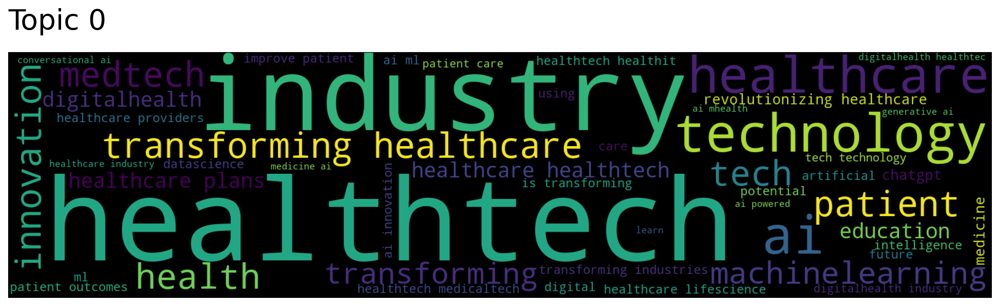

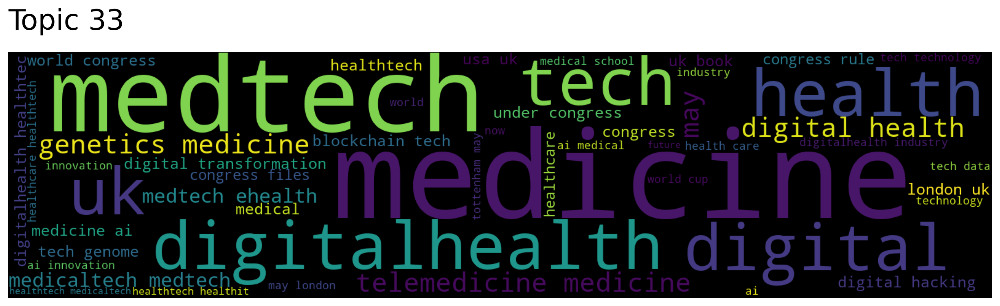

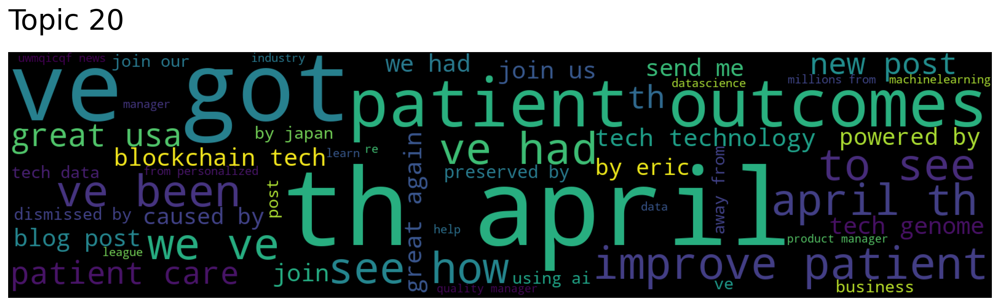

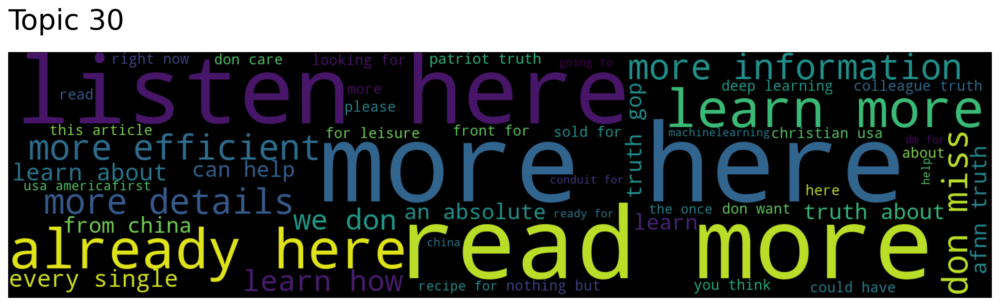

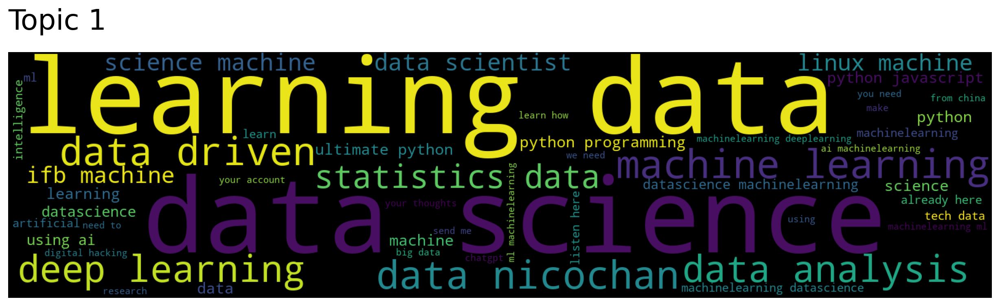

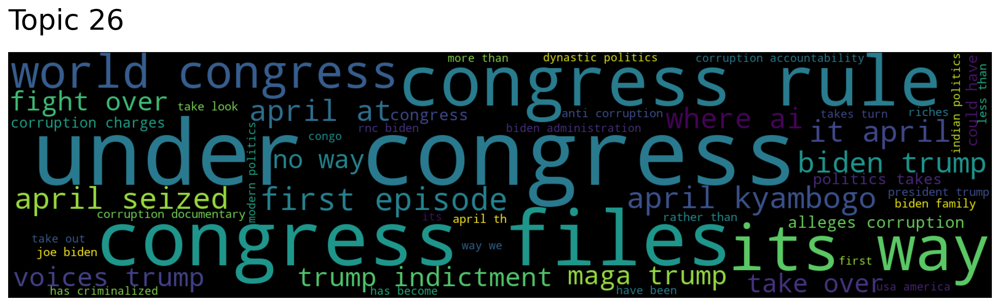

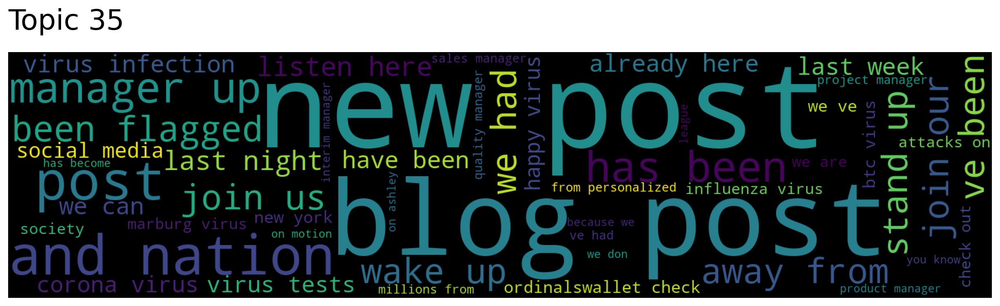

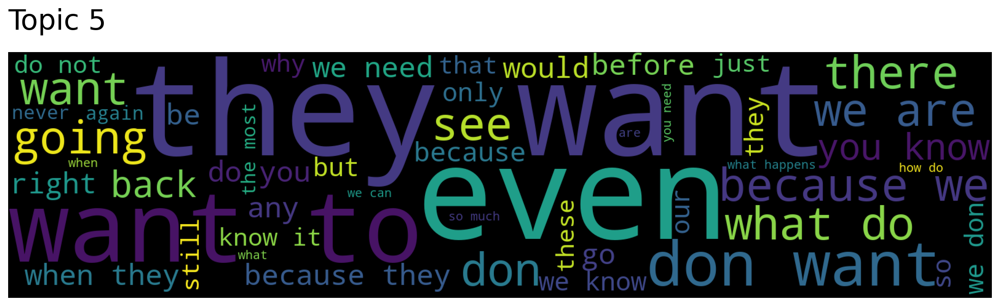

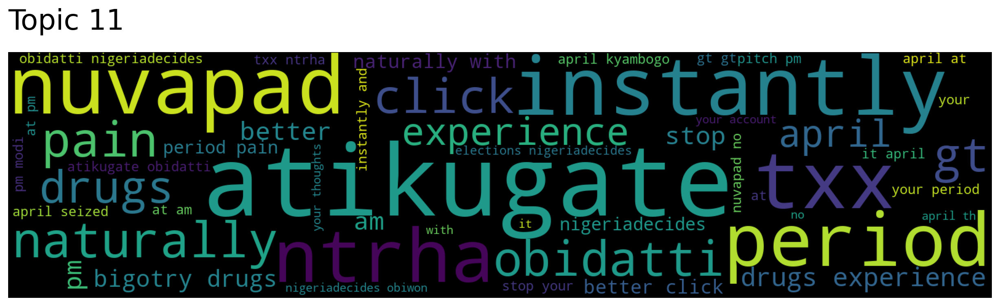

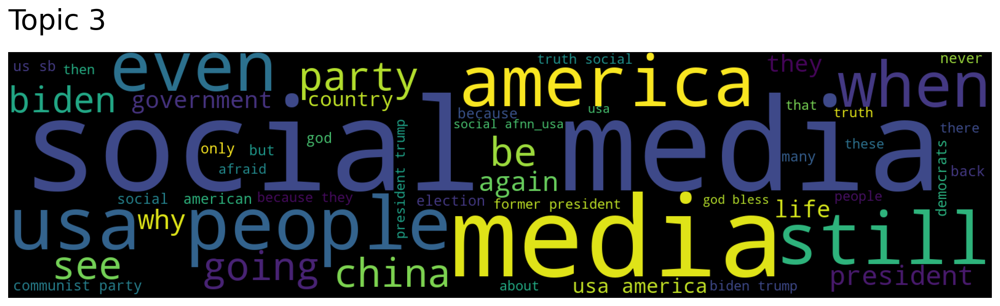

In [164]:
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

**Getting the topics for document(s)**

Get document topics.

The topic of each document will be returned.

The corresponding original topics are returned unless reduced=True,
in which case the reduced topics will be returned.

In [165]:
doc_topics, doc_dist, topic_words, topic_word_scores = model.get_documents_topics(doc_ids=[0,17],num_topics=5)

In [166]:
featured_data.text[:2].tolist()

['"Ah, yes. I just love waking up to the sweet aroma of political chaos and corruption in the morning. It\'s like a breath of fresh air...if that air was filled with hot garbage." #politics #sarcasm',
 'When @ViolavonCramon\nflies to Georgia 🇬🇪 to take part in a protest to support a person accused of using molotov cocktails against the police, who pays her expenses?\n\n#100corruptMEPs\n#zombieNGOs #Corruption\n\n@KubiliusA\n@shpapuashvili\n@AnnaFotyga_PE \n\nhttps://t.co/bS4NsgewiK']

In [167]:
for doc_topic, dist, topic_word, topic_word_score in zip(doc_topics, doc_dist, topic_words, topic_word_scores):
    print(f"Topic number: {doc_topic}\nDocument distribution: {dist}\nTopic words: \n{topic_word}\n")
    print("----------")

Topic number: [ 7  9 10 17  6]
Document distribution: [0.62161845 0.46786454 0.43788528 0.42940047 0.41218176]
Topic words: 
[['daddy' 'politics without' 'politics daddy' 'love' 'without'
  'they were' 'daddy of' 'yes daddy' 'daddy yes' 'bitterness daddy'
  'sugar daddy' 'competence daddy' 'based on' 'issue based' 'big'
  'during' 'politics' 'based' 'modern politics' 'indian politics'
  'government' 'dynastic politics' 'make money' 'communist party' 'party'
  'simple how' 'get ready' 'even' 'make move' 'make sure' 'she' 'there'
  'were' 'how much' 'election' 'only' 'used to' 'still' 'would' 'who'
  'we' 'these' 'was sacked' 'day' 'be used' 'through' 'they' 'as' 'going'
  'today']
 ['chelsea manager' 'graham potter' 'graham' 'potter' 'after graham'
  'chelsea' 'anyone who' 'those who' 'who bought' 'league'
  'premier league' 'football league' 'champions league' 'after' 'well as'
  'as part' 'as well' 'such as' 'as we' 'job' 'man' 'him' 'first'
  'manager' 'who' 'next' 'at am' 'football'

**Reduced documents**

Once the hierarchical_topic_reduction() is applied to the algorithm, it saves the reduced number to be made used of within other methods.

In [168]:
reduced_topics = model.hierarchical_topic_reduction(6)

In [169]:
reduced_topics # reduced to 6 topics

[[1, 30, 33, 0],
 [10, 18, 9, 7, 2],
 [11, 34, 39, 38, 22, 26, 44, 36, 40, 25, 37, 12, 3],
 [31, 24, 6, 42, 19, 4],
 [35, 20, 43, 13, 16, 17, 45, 32, 8, 23, 5],
 [27, 15, 29, 14, 28, 41, 21]]

In [170]:
model.get_topic_hierarchy()

[[1, 30, 33, 0],
 [10, 18, 9, 7, 2],
 [11, 34, 39, 38, 22, 26, 44, 36, 40, 25, 37, 12, 3],
 [31, 24, 6, 42, 19, 4],
 [35, 20, 43, 13, 16, 17, 45, 32, 8, 23, 5],
 [27, 15, 29, 14, 28, 41, 21]]

**Querying the document**

In [177]:
query = "Ai can be used to save lives?"
query2 = "elections in NIgeria?"
ef =None
num_doc=2
return_docs = True
index = True
documents,doc_scores, doc_ids = model.query_documents(query=query2,
                                                ef=ef,num_docs=num_doc,
                                                return_documents=return_docs,
                                                use_index=False,)

In [178]:
for doc,score,ids in zip(documents,doc_scores,doc_ids):
    print(f"Document {ids}:{doc}\n Score:{score}\n")

Document 517:Happy Saturday!
#Nigeria #Nigeriadecide2023 #NigeriaDecides2023 #NigeriaVoteWatch2023 #NigeriaNews #nigerianfood #Nigerians #NairaScarcity #nairaredesign #naijablog #Naija #Naijaleaks #naijafarmertips #NaijaBet #nowornever #Obidients https://t.co/TWaOa8Fd7x
 Score:0.9149987697601318

Document 508:Peter Obi won the February 25, 2023 Nigeria Presidential elections!
Peter Obi won the February 25, 2023 Nigeria Presidential elections!
Peter Obi won the February 25, 2023 Nigeria Presidential elections!
#PeterObiIsMyPresident
#NigeriaDecides2023
 Score:0.899449348449707



In [179]:
# Reduced
query = "Ai can be used to save lives?"
query2 = "elections in NIgeria?"
num_doc=2
reduced=True
topics_words,word_scores, topic_scores, topic_nums = model.query_topics(query=query2,
                                                num_topics=num_doc,
                                                reduced=reduced)

In [180]:
for topics_words, topic_scores, topic_nums in zip(topics_words,topic_scores, topic_nums):
    print(f"Topic {topic_nums}:\nWords: {topics_words}\nTopic score:{topic_scores}\n")

Topic 5:
Words: ['teaching job' 'turn' 'riches' 'riches takes' 'of society' 'congo mining'
 'mining riches' 'society and' 'fight' 'washington' 'congo' 'and congo'
 'takes' 'the once' 'mining' 'going to' 'please repost' 'away from' 'over'
 'right now' 'don miss' 'takes turn' 'or serious' 'others follow' 'please'
 'can help' 'inbox now' 'now available' 'apply now' 'don want'
 'nothing but' 'guo now' 'nigeria' 'fight over' 'turn in' 'we don'
 'nation' 'politics takes' 'in washington' 'go' 'then' 'away'
 'over corruption' 'taking over' 'election' 'last' 'how many' 'him' 'job'
 'once']
Topic score:0.5234166979789734

Topic 1:
Words: ['even' 'years' 'be' 'last' 'would' 'who' 'there' 'but' 'during'
 'would be' 'still' 'going' 'would have' 'made' 'his' 'any' 'party' 'they'
 'potter' 'man' 'after' 'go' 'that' 'right' 'back' 'election' 'could'
 'football' 'league' 'first' 'see' 'as' 'government' 'were' 'never' 'like'
 'very' 'chelsea' 'had' 'have' 'graham' 'before' 'messi' 'god' 'good'
 'job' 'a

**Get Topics**

This will return the topics in decreasing size.

In [183]:
topic_words, word_scores, topic_nums = model.get_topics(reduced=True) # n_topics

**topic_words:** For each topic the top 50 words are returned, in order of semantic similarity to topic.

**word_scores:** For each topic the cosine similarity scores of the top 50 words to the topic are returned.

**topic_nums:** The unique index of every topic will be returned.


They are all arrays/list values

In [184]:
# topic_nums
# [ 0,  1,  2,  3,  4,  5]

for words, scores, topic in zip(topic_words, word_scores, topic_nums):
    print(f"Topic: {topic}\nWords: {words} ")

Topic: 0
Words: ['healthtech' 'machinelearning' 'ai' 'technology' 'industry' 'datascience'
 'healthcare' 'patient' 'intelligence' 'health' 'tech' 'python' 'medtech'
 'artificial' 'learn' 'ml' 'data' 'chatgpt' 'science' 'innovation' 'using'
 'digital' 'transforming healthcare' 'transforming' 'ai ml' 'education'
 'digitalhealth' 'potential' 'machine' 'medicine' 'ml tools' 'ml models'
 'learning' 'future' 'healthcare healthtech' 'tech technology' 'help'
 'transforming industries' 'check' 'tech data' 'is transforming' 'care'
 'improve patient' 'more' 'patient outcomes' 'research' 'ai innovation'
 'healthcare plans' 'ml machinelearning' 'read'] 
Topic: 1
Words: ['even' 'years' 'be' 'last' 'would' 'who' 'there' 'but' 'during'
 'would be' 'still' 'going' 'would have' 'made' 'his' 'any' 'party' 'they'
 'potter' 'man' 'after' 'go' 'that' 'right' 'back' 'election' 'could'
 'football' 'league' 'first' 'see' 'as' 'government' 'were' 'never' 'like'
 'very' 'chelsea' 'had' 'have' 'graham' 'before' '

**Search Topics**

We are going to search for topics most similar to healthcare.

In [186]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["healthcare"], 
                                                                            reduced=True,num_topics=6)

**topic_words:** For each topic the top 50 words are returned, in order of semantic similarity to topic.

**word_scores:** For each topic the cosine similarity scores of the top 50 words to the topic are returned.

**topic_scores:** For each topic the cosine similarity to the search keywords will be returned.

**topic_nums:** The unique index of every topic will be returned.

In [187]:
for words, word_scores, topic_score, topic in zip(topic_words, word_scores, topic_scores, topic_nums):
    print(f"Topic: {topic}, Score:{topic_score}\nWords: {words}\n")

Topic: 0, Score:0.6717711552078917
Words: ['healthtech' 'machinelearning' 'ai' 'technology' 'industry' 'datascience'
 'healthcare' 'patient' 'intelligence' 'health' 'tech' 'python' 'medtech'
 'artificial' 'learn' 'ml' 'data' 'chatgpt' 'science' 'innovation' 'using'
 'digital' 'transforming healthcare' 'transforming' 'ai ml' 'education'
 'digitalhealth' 'potential' 'machine' 'medicine' 'ml tools' 'ml models'
 'learning' 'future' 'healthcare healthtech' 'tech technology' 'help'
 'transforming industries' 'check' 'tech data' 'is transforming' 'care'
 'improve patient' 'more' 'patient outcomes' 'research' 'ai innovation'
 'healthcare plans' 'ml machinelearning' 'read']

Topic: 1, Score:0.06439163063204788
Words: ['even' 'years' 'be' 'last' 'would' 'who' 'there' 'but' 'during'
 'would be' 'still' 'going' 'would have' 'made' 'his' 'any' 'party' 'they'
 'potter' 'man' 'after' 'go' 'that' 'right' 'back' 'election' 'could'
 'football' 'league' 'first' 'see' 'as' 'government' 'were' 'never' 'lik

Topics 0 is highly related to healthcare

**Search Documents by Topic**

We are going to search by topic 0. i.e. Documents similar to topic 0.

**documents:** The documents in a list, the most similar are first.

**doc_scores:** Semantic similarity of document to topic. The cosine similarity of the document and topic vector.

**doc_ids:** Unique ids of documents. If ids were not given, the index of document in the original corpus

In [188]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=0, num_docs=5
                                        ,reduced=True)

In [189]:
for doc, score, doc_id in zip(documents,document_scores,document_ids):
    print(f"Document: {doc_id}, Score relationship to  topic 0: {score}")
    print("-----------")
    print(doc)
    print("-----------\n")

Document: 2059, Score relationship to  topic 0: 0.8211516737937927
-----------
#Artificialintelligence develops #cancer treatment in just 30 days https://t.co/6pQZ1oSPvV #bigdata #deeplearning #AI #DL #ML #Healthcare #python #healthtech #MachineLearning #deeplearning #NLP #rstats #innovation #techforgood #Data #tech #DataScience #technology @DailyMailUK
-----------

Document: 1666, Score relationship to  topic 0: 0.7892743349075317
-----------
#ai #ml #artificialintelligence #machinelearning #datascience #bigdata #analytics #blockchain #tech #data @Nicochan33 @TrippBraden @Paula_Piccard @haroldsinnott @sallyeaves
Planning A Data Strategy For Training Healthcare AI Applications https://t.co/z2XsfvXQqS
-----------

Document: 2058, Score relationship to  topic 0: 0.7814509272575378
-----------
#Artificialintelligence develops #cancer treatment in just 30 days https://t.co/ePVsF5k2mz #bigdata #deeplearning #AI #DL #ML #Healthcare #python #healthtech #MachineLearning #deeplearning #NLP #rst

Topic 0 is related to healthcare and AI which goes to show that the above documents; 2059, 1666, 2058, 1876 are highly related to topic 0.

**Semantic Search Documents by Keywords**

Search documents for content semantically similar to machine learning, Data science and healthcare.

In [194]:
# documents, document_scores, document_ids = (model.
#                                 search_documents_by_keywords
#                                 # (keywords=["machine",'learning'], num_docs=5))
#                                 (keywords=["machine learning", "Data science","healthcare"], num_docs=6
#                                     ))

# # This does not have the reduced parameter

In [195]:
# for doc, score, doc_id in zip(documents,document_scores,document_ids):
#     print(f"Document: {doc_id}\nScore relationship the keywords: {score}")
#     print("-----------")
#     print(doc)
#     print("-----------\n")

The above documents namely; 1968, 2100, 1905, 1970 are semantically similar the words machine learning, Data science and healthcare.

**Similar Keywords**

Search semantic similarity search of words relating to healthcare.

In [ ]:
# words, word_scores = model.similar_words(keywords=["healthcare"], keywords_neg=[], num_words=20)
# # # This does not have the reduced parameter

In [196]:
# for word, score in zip(words, word_scores):
#     print(f"Word: {word}, Score: {score}")

**Semantic similarity search of documents.**

The most semantically similar documents to the semantic combination of document ids provided will be returned. If negative document ids are provided, the documents will be semantically dissimilar to those document ids. Documents will be ordered by decreasing similarity. This method finds the closest document vectors to the provided documents averaged.

In [ ]:
# documents, doc_scores, doc_ids = (model.
#                                 search_documents_by_documents(
#                                     doc_ids=[0],
#                                     num_docs=5,
#                                     # ef=2
#                                 ))
# # # This does not have the reduced parameter

In [197]:
# print(f"Document at index 0\n{featured_data.text[0]}\n")
# for doc, score, doc_id in zip(documents,doc_scores,doc_ids):
#     print(f"Document: {doc_id}\nScore relationship document at index 0: {score}")
#     print("-----------")
#     print(doc)
#     print("-----------\n")

The above documents are related to document 0 from the dataset.

**Generate Word Clouds**

Using a topic number you can generate a word cloud. We are going to generate word clouds for the top 5 most similar topics to our healthcare topic search from above.

In [198]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["healthcare"], 
                                                num_topics=6,reduced=True)

In [199]:
len(topic_nums)

6

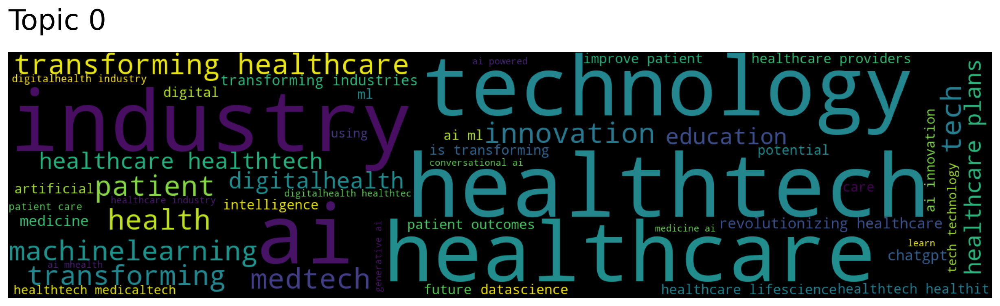

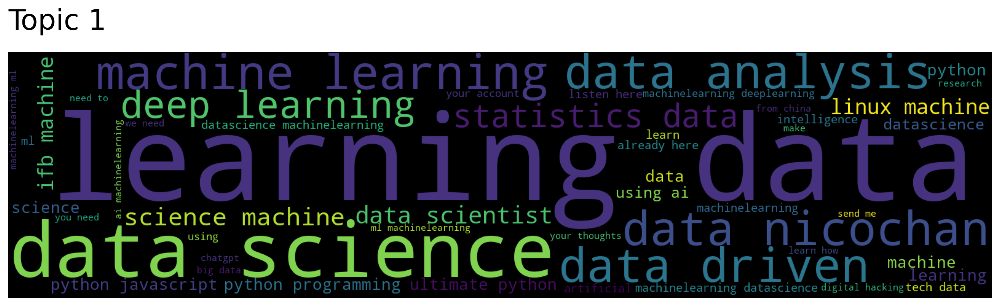

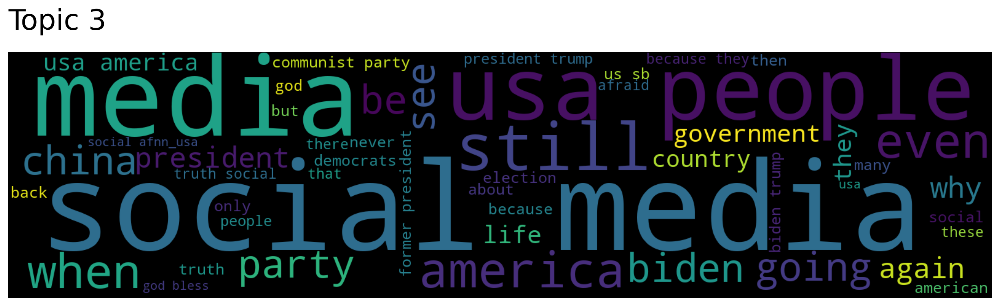

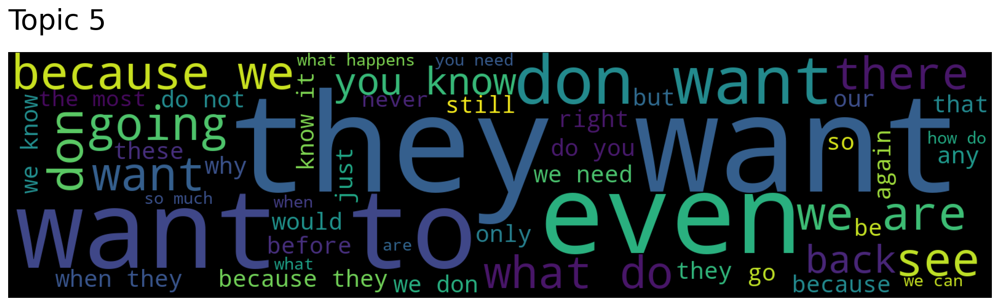

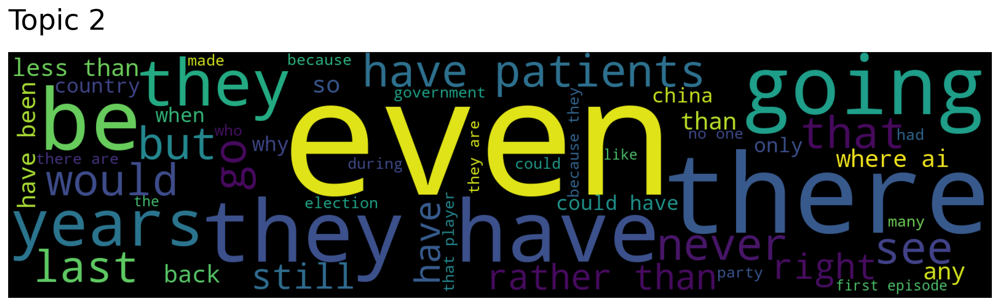

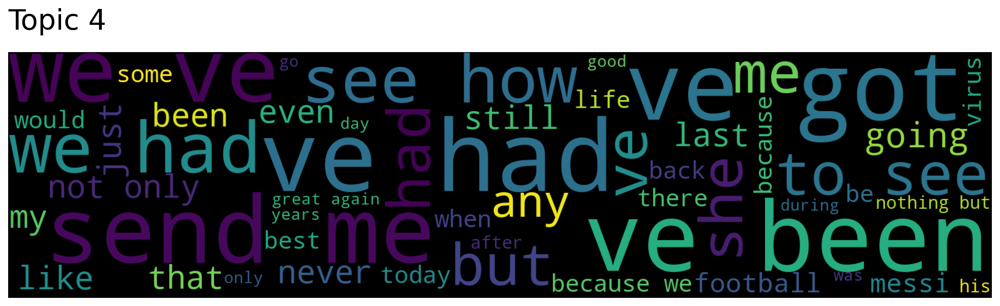

In [200]:
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

**Getting the topics for document(s)**

Get document topics.

The topic of each document will be returned.

The corresponding original topics are returned unless reduced=True,
in which case the reduced topics will be returned.

In [201]:
doc_topics, doc_dist, topic_words, topic_word_scores = model.get_documents_topics(doc_ids=[0,17],
                                    reduced=True,num_topics=5)

In [204]:
featured_data.text[0]

'"Ah, yes. I just love waking up to the sweet aroma of political chaos and corruption in the morning. It\'s like a breath of fresh air...if that air was filled with hot garbage." #politics #sarcasm'

In [207]:
featured_data.text[17]

'Senior officials to take over China’s football body amid corruption crackdown https://t.co/RbXTegXc37'

In [208]:
for doc_topic, dist, topic_word, topic_word_score in zip(doc_topics, doc_dist, topic_words, topic_word_scores):
    print(f"Topic number: {doc_topic}\nDocument distribution: {dist}\nTopic words: \n{topic_word}\n")
    print("----------")

Topic number: [1 2 4 3 5]
Document distribution: [0.631929   0.31889713 0.2273515  0.12043285 0.05272818]
Topic words: 
[['learning data' 'data science' 'machine learning' 'data nicochan'
  'data driven' 'data analysis' 'deep learning' 'statistics data'
  'science machine' 'data scientist' 'linux machine' 'ifb machine'
  'python programming' 'python javascript' 'python' 'ultimate python'
  'machine' 'science' 'learning' 'data' 'datascience' 'using ai'
  'datascience machinelearning' 'machinelearning datascience' 'learn'
  'machinelearning' 'intelligence' 'already here' 'tech data' 'ml'
  'artificial' 'listen here' 'machinelearning deeplearning'
  'your account' 'using' 'ml machinelearning' 'from china'
  'machinelearning ml' 'ai machinelearning' 'your thoughts' 'send me'
  'big data' 'you need' 'learn how' 'we need' 'need to' 'digital hacking'
  'chatgpt' 'research' 'make']
 ['even' 'there' 'they have' 'be' 'going' 'years' 'they' 'have patients'
  'but' 'see' 'never' 'go' 'would' 'that